# Task 2: Train, validate and develop a Machine Learning pipeline using PyCaret. 



In [1]:
import pandas as pd

In [2]:
# check installed version
import pycaret
pycaret.__version__

'3.0.4'

In [3]:
# importing dataset
data = pd.read_csv("detection1.csv")
data.head()

FileNotFoundError: [Errno 2] No such file or directory: 'detection1.csv'

In [4]:
data = data.drop('Unnamed: 0', axis=1)

In [5]:
import category_encoders as ce
from pycaret.anomaly import *
encoder = ce.TargetEncoder(cols=['DEPT_NAME', 'DIV_NAME', 'MERCHANT', 'CAT_DESC'])
data_encoded = encoder.fit_transform(data, data['AMT'])

In [6]:
data = data.drop('DEPT_NAME', axis=1)
data = data.drop('DIV_NAME', axis=1)
data = data.drop('MERCHANT', axis=1)
data = data.drop('CAT_DESC', axis=1)

### Why remove categorical values?
when using categorical values vs using categorical values, the prediction outcome is similar. Therefore, i chose to remove them.

In [7]:
data

,FISCAL_YR,FISCAL_MTH,TRANS_DT,AMT
0,2017,1,2016-06-03,-5.50
1,2017,1,2016-06-26,18.31
2,2017,1,2016-06-26,21.61
3,2017,1,2016-06-26,22.39
4,2017,1,2016-06-26,5.44
...,...,...,...,...
12986,2022,6,2021-12-12,52.58
12987,2022,6,2021-12-13,14.91
12988,2022,6,2021-12-13,111.00
12989,2022,6,2021-12-05,99.99


# Setup

In [8]:
# import pycaret anomaly and init setup
from pycaret.anomaly import *
s = setup(data, session_id = 123)

,Description,Value
0,Session id,123
1,Original data shape,"(12991, 4)"
2,Transformed data shape,"(12991, 1835)"
3,Numeric features,3
4,Categorical features,1
5,Preprocess,True
6,Imputation type,simple
7,Numeric imputation,mean
8,Categorical imputation,mode
9,Maximum one-hot encoding,-1


In [9]:
# import AnomalyExperiment and init the class
from pycaret.anomaly import AnomalyExperiment
exp = AnomalyExperiment()

In [10]:
# check the type of exp
type(exp)

pycaret.anomaly.oop.AnomalyExperiment

In [11]:
# init setup on exp
exp.setup(data, session_id = 123)

,Description,Value
0,Session id,123
1,Original data shape,"(12991, 4)"
2,Transformed data shape,"(12991, 1835)"
3,Numeric features,3
4,Categorical features,1
5,Preprocess,True
6,Imputation type,simple
7,Numeric imputation,mean
8,Categorical imputation,mode
9,Maximum one-hot encoding,-1


# Create Model


In [12]:
# train iforest model
iforest = create_model('iforest')
iforest

Processing:   0%|          | 0/3 [00:00<?, ?it/s]

IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=123, verbose=0)

In [13]:
# to check all the available models
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pycaret.internal.patches.pyod.CBLOFForceToDouble
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


# Assign Model

In [14]:
iforest_anomalies = assign_model(iforest)
iforest_anomalies

,FISCAL_YR,FISCAL_MTH,TRANS_DT,AMT,Anomaly,Anomaly_Score
0,2017,1,2016-06-03,-5.500000,0,-0.006414
1,2017,1,2016-06-26,18.309999,0,-0.006414
2,2017,1,2016-06-26,21.610001,0,-0.006414
3,2017,1,2016-06-26,22.389999,0,-0.006414
4,2017,1,2016-06-26,5.440000,0,-0.006414
...,...,...,...,...,...,...
12986,2022,6,2021-12-12,52.580002,0,-0.007343
12987,2022,6,2021-12-13,14.910000,0,-0.007343
12988,2022,6,2021-12-13,111.000000,0,-0.007101
12989,2022,6,2021-12-05,99.989998,0,-0.004514


# Analyze Model

In [15]:
# tsne plot anomalies
plot_model(iforest, plot = 'tsne')

# Prediction

In [16]:
# predict on test set
iforest_pred = predict_model(iforest, data=data)
iforest_pred

,FISCAL_YR,FISCAL_MTH,TRANS_DT_2016-06-03,TRANS_DT_2016-06-26,TRANS_DT_2016-06-27,TRANS_DT_2016-06-28,TRANS_DT_2016-06-29,TRANS_DT_2016-06-30,TRANS_DT_2016-07-01,TRANS_DT_2016-07-02,...,TRANS_DT_2021-12-13,TRANS_DT_2021-12-14,TRANS_DT_2021-12-19,TRANS_DT_2021-12-07,TRANS_DT_2021-12-06,TRANS_DT_2021-12-05,TRANS_DT_2021-12-09,AMT,Anomaly,Anomaly_Score
0,2017.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.50,0,-0.006414
1,2017.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.31,0,-0.006414
2,2017.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.61,0,-0.006414
3,2017.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.39,0,-0.006414
4,2017.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.44,0,-0.006414
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12986,2022.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,52.58,0,-0.007343
12987,2022.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,14.91,0,-0.007343
12988,2022.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,111.00,0,-0.007101
12989,2022.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,99.99,0,-0.004514


# Save Model

In [17]:
# save pipeline
save_model(iforest, 'iforest_pipeline1')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=FastMemory(location=/var/folders/56/6ngfmf2j3cl0tgpthcx0lmsm0000gn/T/joblib),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['FISCAL_YR', 'FISCAL_MTH', 'AMT'],
                                     transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=['TRANS_DT'],
                                     transformer=SimpleImputer(strategy='most_frequent'))),
                 ('onehot_encoding',
                  TransformerWrapper(include=['TRANS_DT'],
                                     transformer=OneHotEncoder(cols=['TRANS_DT'],
                                                               handle_missing='return_nan',
                                                               use_cat_names=True))),
                 ('trained_model',
                  IForest(behaviour='new', bootstrap=False, contamination=0.05,
     max_features=1.0, max_samples='auto', n_estimator

In [18]:
# load pipeline
loaded_iforest_pipeline = load_model('iforest_pipeline1')
loaded_iforest_pipeline

Transformation Pipeline and Model Successfully Loaded


Pipeline(memory=FastMemory(location=/var/folders/56/6ngfmf2j3cl0tgpthcx0lmsm0000gn/T/joblib),
         steps=[('numerical_imputer',
                 TransformerWrapper(include=['FISCAL_YR', 'FISCAL_MTH', 'AMT'],
                                    transformer=SimpleImputer())),
                ('categorical_imputer',
                 TransformerWrapper(include=['TRANS_DT'],
                                    transformer=SimpleImputer(strategy='most_frequent'))),
                ('onehot_encoding',
                 TransformerWrapper(include=['TRANS_DT'],
                                    transformer=OneHotEncoder(cols=['TRANS_DT'],
                                                              handle_missing='return_nan',
                                                              use_cat_names=True))),
                ('trained_model',
                 IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=123, verbose=0))])

## Setup

In [19]:
s = setup(data, session_id = 123)

,Description,Value
0,Session id,123
1,Original data shape,"(12991, 4)"
2,Transformed data shape,"(12991, 1835)"
3,Numeric features,3
4,Categorical features,1
5,Preprocess,True
6,Imputation type,simple
7,Numeric imputation,mean
8,Categorical imputation,mode
9,Maximum one-hot encoding,-1


In [20]:
# check all available config
get_config()

{'USI',
 'X',
 'X_train',
 'X_train_transformed',
 'X_transformed',
 '_available_plots',
 '_ml_usecase',
 'data',
 'dataset',
 'dataset_transformed',
 'exp_id',
 'exp_name_log',
 'gpu_n_jobs_param',
 'gpu_param',
 'html_param',
 'idx',
 'is_multiclass',
 'log_plots_param',
 'logging_param',
 'memory',
 'n_jobs_param',
 'pipeline',
 'seed',
 'train',
 'train_transformed',
 'variable_and_property_keys',
 'variables'}

In [21]:
# lets access X_train_transformed
get_config('X_train_transformed')

,FISCAL_YR,FISCAL_MTH,TRANS_DT_2016-06-03,TRANS_DT_2016-06-26,TRANS_DT_2016-06-27,TRANS_DT_2016-06-28,TRANS_DT_2016-06-29,TRANS_DT_2016-06-30,TRANS_DT_2016-07-01,TRANS_DT_2016-07-02,...,TRANS_DT_2021-12-10,TRANS_DT_2021-12-11,TRANS_DT_2021-12-13,TRANS_DT_2021-12-14,TRANS_DT_2021-12-19,TRANS_DT_2021-12-07,TRANS_DT_2021-12-06,TRANS_DT_2021-12-05,TRANS_DT_2021-12-09,AMT
0,2017.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.500000
1,2017.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.309999
2,2017.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.610001
3,2017.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.389999
4,2017.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.440000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12986,2022.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,52.580002
12987,2022.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,14.910000
12988,2022.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,111.000000
12989,2022.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,99.989998


In [22]:
# another example: let's access seed
print("The current seed is: {}".format(get_config('seed')))

# now lets change it using set_config
set_config('seed', 786)
print("The new seed is: {}".format(get_config('seed')))

The current seed is: 123
The new seed is: 786


In [23]:
# init setup with bin_numeric_feature

s = setup(data, session_id = 123,
          bin_numeric_features=['AMT'])

,Description,Value
0,Session id,123
1,Original data shape,"(12991, 4)"
2,Transformed data shape,"(12991, 1835)"
3,Numeric features,3
4,Categorical features,1
5,Preprocess,True
6,Imputation type,simple
7,Numeric imputation,mean
8,Categorical imputation,mode
9,Maximum one-hot encoding,-1


<Axes: >

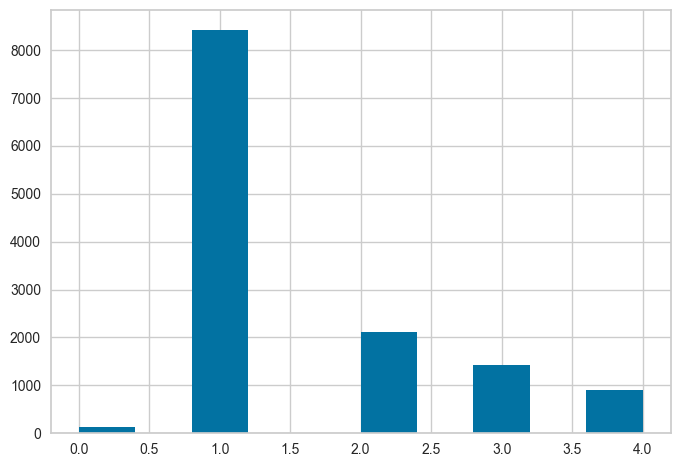

In [24]:
# lets check the X_train_transformed to see effect of params passed
get_config('X_train_transformed')['AMT'].hist()

<Axes: >

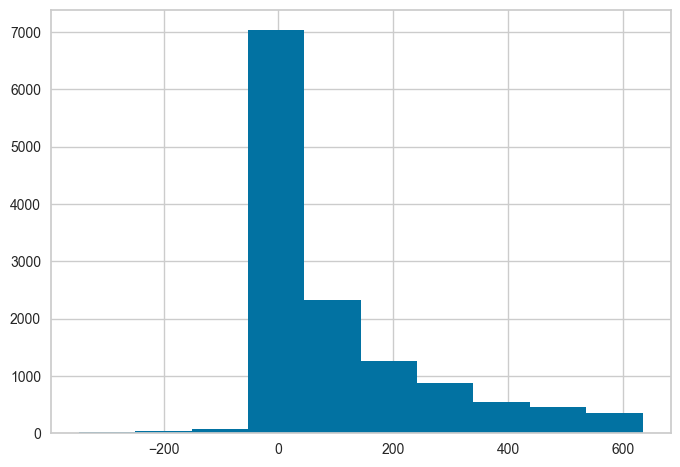

In [25]:
get_config('X_train')['AMT'].hist()

## Experiment Logging

In [26]:
from pycaret.anomaly import *
import mlflow 
mlflow.set_tracking_uri('http://127.0.0.1:5000')
s = setup(data, session_id = 123, log_experiment=True, experiment_name='anomaly_project1')

,Description,Value
0,Session id,123
1,Original data shape,"(12991, 4)"
2,Transformed data shape,"(12991, 1835)"
3,Numeric features,3
4,Categorical features,1
5,Preprocess,True
6,Imputation type,simple
7,Numeric imputation,mean
8,Categorical imputation,mode
9,Maximum one-hot encoding,-1


In [27]:
# train iforest
iforest = create_model('iforest')

Processing:   0%|          | 0/3 [00:00<?, ?it/s]

In [28]:
#start mlflow server on localhost:5000
!mlflow ui

/bin/bash: mlflow: command not found


In [29]:
# help(setup)

## Create Model

In [30]:
# check all the available models
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pycaret.internal.patches.pyod.CBLOFForceToDouble
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


In [31]:
# train iforest model
iforest = create_model('iforest')

Processing:   0%|          | 0/3 [00:00<?, ?it/s]

In [32]:
iforest

IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=123, verbose=0)

In [33]:
# train iforest with specific model parameter
create_model('iforest', contamination = 0.1)

Processing:   0%|          | 0/3 [00:00<?, ?it/s]

IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=123, verbose=0)

In [34]:
# help(create_model)

In [35]:
knn = create_model('knn')

Processing:   0%|          | 0/3 [00:00<?, ?it/s]

In [36]:
knn

KNN(algorithm='auto', contamination=0.05, leaf_size=30, method='largest',
  metric='minkowski', metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
  radius=1.0)

In [37]:
create_model('knn')

Processing:   0%|          | 0/3 [00:00<?, ?it/s]

KNN(algorithm='auto', contamination=0.05, leaf_size=30, method='largest',
  metric='minkowski', metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
  radius=1.0)

## Assign Model


In [38]:
iforest_results = assign_model(iforest)
iforest_results

,FISCAL_YR,FISCAL_MTH,TRANS_DT,AMT,Anomaly,Anomaly_Score
0,2017,1,2016-06-03,-5.500000,0,-0.006414
1,2017,1,2016-06-26,18.309999,0,-0.006414
2,2017,1,2016-06-26,21.610001,0,-0.006414
3,2017,1,2016-06-26,22.389999,0,-0.006414
4,2017,1,2016-06-26,5.440000,0,-0.006414
...,...,...,...,...,...,...
12986,2022,6,2021-12-12,52.580002,0,-0.007343
12987,2022,6,2021-12-13,14.910000,0,-0.007343
12988,2022,6,2021-12-13,111.000000,0,-0.007101
12989,2022,6,2021-12-05,99.989998,0,-0.004514


In [39]:
knn_df = assign_model(knn)
knn_df

,FISCAL_YR,FISCAL_MTH,TRANS_DT,AMT,Anomaly,Anomaly_Score
0,2017,1,2016-06-03,-5.500000,1,4.109027
1,2017,1,2016-06-26,18.309999,0,1.447791
2,2017,1,2016-06-26,21.610001,0,1.422146
3,2017,1,2016-06-26,22.389999,0,1.467004
4,2017,1,2016-06-26,5.440000,0,1.481081
...,...,...,...,...,...,...
12986,2022,6,2021-12-12,52.580002,0,2.471619
12987,2022,6,2021-12-13,14.910000,0,1.750000
12988,2022,6,2021-12-13,111.000000,0,2.828427
12989,2022,6,2021-12-05,99.989998,0,2.449490


## Plot Model

In [40]:
# tsne plot of anomalies
plot_model(iforest, plot = 'tsne')

In [41]:
import plotly.graph_objects as go

iforest_results_reset = iforest_anomalies.reset_index()

# Create a line plot with the original data
fig = go.Figure()

fig.add_trace(go.Line(x=iforest_results_reset.index, y=iforest_results_reset['AMT'], name='Original Data'))

# Identify anomaly points
anomalies = iforest_results_reset[iforest_results_reset['Anomaly'] == 1]

# Add anomaly points to the plot
fig.add_trace(go.Scatter(x=anomalies.index, y=anomalies['AMT'], mode='markers', name='Anomalies', marker=dict(color='red', size=10)))

# Customize the layout
fig.update_layout(title='Anomaly Detection using Isolation Forest', xaxis_title='Date', yaxis_title='AMT')

# Show the plot
fig.show()

In [42]:
# umap plot of anomalies (you need to install umap library for this separately)
plot_model(iforest, plot = 'umap')

In [43]:
plot_model(knn, plot = 'tsne')

In [44]:
import plotly.graph_objects as go

# Create a line plot with the original data
fig = go.Figure()

fig.add_trace(go.Line(x=knn_df.index, y=knn_df['AMT'], name='Original Data'))

# Identify anomaly points
anomalies = iforest_results_reset[knn_df['Anomaly'] == 1]

# Add anomaly points to the plot
fig.add_trace(go.Scatter(x=anomalies.index, y=anomalies['AMT'], mode='markers', name='Anomalies', marker=dict(color='red', size=10)))

# Customize the layout
fig.update_layout(title='Anomaly Detection using KNN', xaxis_title='Date', yaxis_title='AMT')

# Show the plot
fig.show()

In [45]:
plot_model(knn, plot = 'umap')

## ✅ Save / Load Model
This function saves the transformation pipeline and a trained model object into the current working directory as a pickle file for later use.

In [46]:
# save model
save_model(iforest, 'iforestmodel')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=FastMemory(location=/var/folders/56/6ngfmf2j3cl0tgpthcx0lmsm0000gn/T/joblib),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['FISCAL_YR', 'FISCAL_MTH', 'AMT'],
                                     transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=['TRANS_DT'],
                                     transformer=SimpleImputer(strategy='most_frequent'))),
                 ('onehot_encoding',
                  TransformerWrapper(include=['TRANS_DT'],
                                     transformer=OneHotEncoder(cols=['TRANS_DT'],
                                                               handle_missing='return_nan',
                                                               use_cat_names=True))),
                 ('trained_model',
                  IForest(behaviour='new', bootstrap=False, contamination=0.05,
     max_features=1.0, max_samples='auto', n_estimator

In [47]:
save_model(knn, 'knnmodel')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=FastMemory(location=/var/folders/56/6ngfmf2j3cl0tgpthcx0lmsm0000gn/T/joblib),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['FISCAL_YR', 'FISCAL_MTH', 'AMT'],
                                     transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=['TRANS_DT'],
                                     transformer=SimpleImputer(strategy='most_frequent'))),
                 ('onehot_encoding',
                  TransformerWrapper(include=['TRANS_DT'],
                                     transformer=OneHotEncoder(cols=['TRANS_DT'],
                                                               handle_missing='return_nan',
                                                               use_cat_names=True))),
                 ('trained_model',
                  KNN(algorithm='auto', contamination=0.05, leaf_size=30, method='largest',
   metric='minkowski', metric_params=None,

In [48]:
# load model
loaded_from_disk = load_model('iforestmodel')
loaded_from_disk

Transformation Pipeline and Model Successfully Loaded


Pipeline(memory=FastMemory(location=/var/folders/56/6ngfmf2j3cl0tgpthcx0lmsm0000gn/T/joblib),
         steps=[('numerical_imputer',
                 TransformerWrapper(include=['FISCAL_YR', 'FISCAL_MTH', 'AMT'],
                                    transformer=SimpleImputer())),
                ('categorical_imputer',
                 TransformerWrapper(include=['TRANS_DT'],
                                    transformer=SimpleImputer(strategy='most_frequent'))),
                ('onehot_encoding',
                 TransformerWrapper(include=['TRANS_DT'],
                                    transformer=OneHotEncoder(cols=['TRANS_DT'],
                                                              handle_missing='return_nan',
                                                              use_cat_names=True))),
                ('trained_model',
                 IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=123, verbose=0))])

In [49]:
loaded_from_disk = load_model('knnmodel')
loaded_from_disk

Transformation Pipeline and Model Successfully Loaded


Pipeline(memory=FastMemory(location=/var/folders/56/6ngfmf2j3cl0tgpthcx0lmsm0000gn/T/joblib),
         steps=[('numerical_imputer',
                 TransformerWrapper(include=['FISCAL_YR', 'FISCAL_MTH', 'AMT'],
                                    transformer=SimpleImputer())),
                ('categorical_imputer',
                 TransformerWrapper(include=['TRANS_DT'],
                                    transformer=SimpleImputer(strategy='most_frequent'))),
                ('onehot_encoding',
                 TransformerWrapper(include=['TRANS_DT'],
                                    transformer=OneHotEncoder(cols=['TRANS_DT'],
                                                              handle_missing='return_nan',
                                                              use_cat_names=True))),
                ('trained_model',
                 KNN(algorithm='auto', contamination=0.05, leaf_size=30, method='largest',
  metric='minkowski', metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
  radius=1.0))])

## Save / Load Experiment


In [50]:
# save experiment
save_experiment('assignment')

In [51]:
# load experiment from disk
exp_from_disk = load_experiment('assignment', data=data)

,Description,Value
0,Session id,123
1,Original data shape,"(12991, 4)"
2,Transformed data shape,"(12991, 1835)"
3,Numeric features,3
4,Categorical features,1
5,Preprocess,True
6,Imputation type,simple
7,Numeric imputation,mean
8,Categorical imputation,mode
9,Maximum one-hot encoding,-1


# Predict Unseen Data

In [59]:
data = data.sample(frac=0.95, random_state=786).reset_index(drop=True)
data_unseen = data.drop(data.index).reset_index(drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (8853, 4)
Unseen Data For Predictions: (0, 4)


In [53]:
unseen_predictions = predict_model(knn, data=data_unseen)
unseen_predictions.head()

ValueError: Found array with 0 sample(s) (shape=(0, 3)) while a minimum of 1 is required by SimpleImputer.

In [ ]:
data_predictions = predict_model(knn, data = data)
data_predictions.head()

In [ ]:
save_model(knn,'KNN')

In [ ]:
saved_KNN = load_model('KNN')

In [ ]:
new_prediction = predict_model(saved_KNN, data=data_unseen)

In [ ]:
new_prediction.head()

In [ ]:
# save model to disk
save_model(knn, 'detection-pipeline')

In [ ]:
import mlflow
logged_model = 'runs:/245b251503be4a70a91d62734db90edc/model'

# Load model as a PyFuncModel.
loaded_model = mlflow.pyfunc.load_model(logged_model)

# Predict on a Pandas DataFrame.
import pandas as pd
loaded_model.predict(pd.DataFrame(data))

In [ ]:
print(loaded_model)
pipeline = loaded_model

In [60]:
import mlflow
logged_model = 'runs:/1552b5bbb72146d39f696d61b9b28460/model'

# Load model as a PyFuncModel.
loaded_model = mlflow.pyfunc.load_model(logged_model)

# Predict on a Pandas DataFrame.
import pandas as pd
loaded_model.predict(pd.DataFrame(data))

array([0, 0, 0, ..., 0, 0, 0])

In [61]:
print(loaded_model)
pipeline = loaded_model

mlflow.pyfunc.loaded_model:
  artifact_path: model
  flavor: mlflow.sklearn
  run_id: 1552b5bbb72146d39f696d61b9b28460



In [62]:
print(pipeline)

mlflow.pyfunc.loaded_model:
  artifact_path: model
  flavor: mlflow.sklearn
  run_id: 1552b5bbb72146d39f696d61b9b28460



In [63]:
# create a copy of data 
data3 = data.copy()

In [64]:
data3

,FISCAL_YR,FISCAL_MTH,TRANS_DT,AMT
0,2019,11,2019-04-27,98.49
1,2018,9,2018-03-05,183.32
2,2020,4,2019-10-05,34.90
3,2019,11,2019-05-03,14.37
4,2020,1,2019-07-16,6.93
...,...,...,...,...
8848,2021,12,2021-06-17,301.61
8849,2021,3,2020-09-14,19.38
8850,2017,3,2016-09-19,245.00
8851,2022,1,2021-07-02,23.00


In [65]:
import pandas as pd
from sklearn.ensemble import IsolationForest

# Drop unnecessary columns
data3 = data3.drop(['TRANS_DT'], axis=1)

# Train the Isolation Forest model
iforest = IsolationForest(contamination=0.05)
iforest.fit(data3)

# Predict anomalies on the same data
predictions = iforest.predict(data3)

# Create a DataFrame with original data and predicted anomalies
predictions_df = pd.DataFrame(data3, columns=data3.columns)
predictions_df['Anomaly_Prediction'] = predictions

# Display the DataFrame with original data and predicted anomalies
predictions_df.head()

,FISCAL_YR,FISCAL_MTH,AMT,Anomaly_Prediction
0,2019,11,98.49,1
1,2018,9,183.32,1
2,2020,4,34.90,1
3,2019,11,14.37,1
4,2020,1,6.93,1
